# Concord analysis of kidney

In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [4]:
proj_name = "kidney_kim"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/McMahon_kidney/GSE232481/"
data_dir = Path(data_dir)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cuda:3


'Dec05-0731'

In [ ]:
import os
import scanpy as sc

# Directories containing the data
base_dir_new = "../data/McMahon_kidney/GSE232481/project/mcmahona_214/rmscr/shared_resources/aransick/Cell Ranger Files/2019/new_Mp0_r1+r2"
base_dir_old = "../data/McMahon_kidney/GSE232481/project/mcmahona_214/rmscr/shared_resources/aransick/Cell Ranger Files/2019/old_Mp0_3x3"

# Define folders and corresponding sample names
folders_samples = {
    # Data from the "new" directory
    os.path.join(base_dir_new, "F4/outs/filtered_feature_bc_matrix"): "F4",
    os.path.join(base_dir_new, "F5/outs/filtered_feature_bc_matrix"): "F5",
    os.path.join(base_dir_new, "F6/outs/filtered_feature_bc_matrix"): "F6",
    os.path.join(base_dir_new, "M10/outs/filtered_feature_bc_matrix"): "M10",
    os.path.join(base_dir_new, "M8/outs/filtered_feature_bc_matrix"): "M8",
    os.path.join(base_dir_new, "M9/outs/filtered_feature_bc_matrix"): "M9",

    # Data from the "old" directory
    os.path.join(base_dir_old, "M4_3x3/filtered_feature_bc_matrix"): "M4_3x3",
    os.path.join(base_dir_old, "M5_3x3/filtered_feature_bc_matrix"): "M5_3x3",
    os.path.join(base_dir_old, "M6_3X3/filtered_feature_bc_matrix"): "M6_3x3",
    os.path.join(base_dir_old, "M7_3x3/filtered_feature_bc_matrix"): "M7_3x3",
    os.path.join(base_dir_old, "Mp0_F1_3x3/outs/filtered_feature_bc_matrix"): "Mp0_F1_3x3",
    os.path.join(base_dir_old, "Mp0_F2_3x3/outs/filtered_feature_bc_matrix"): "Mp0_F2_3x3",
    os.path.join(base_dir_old, "Mp0_F3_3x3/outs/filtered_feature_bc_matrix"): "Mp0_F3_3x3",
}

# Initialize a list to store AnnData objects
adata_list = []

# Iterate over each folder and sample name
for folder, sample_name in folders_samples.items():
    # Check if the folder exists
    if not os.path.exists(folder):
        print(f"Warning: Folder {folder} does not exist. Skipping...")
        continue

    # Read the data
    adata = sc.read_10x_mtx(folder, var_names="gene_symbols", cache=True)

    # Add the sample name as a column in obs
    adata.obs["sample"] = sample_name

    # Append to the list
    adata_list.append(adata)

# Concatenate all AnnData objects
adata_combined = sc.concat(adata_list, axis=0)

# Ensure unique obs_names (cell barcodes)
adata_combined.obs_names = [f"{cell_barcode}-{sample}" for cell_barcode, sample in zip(adata_combined.obs_names, adata_combined.obs["sample"])]
adata_combined.obs['dataset'] = 'GSE232481_Kim'
# Save the combined AnnData object
adata_combined.write(data_dir / "GSE232481_combined_data.h5ad")

# Check the result
print(adata_combined)

AnnData object with n_obs × n_vars = 72017 × 31053
    obs: 'sample'


In [5]:
adata = sc.read(data_dir / "GSE232481_combined_data.h5ad")

### No batch correction, PCA and UMAP

In [7]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
ccd.ul.score_cell_cycle(adata, organism='Mm')

ParseError: mismatched tag: line 62, column 2 (<string>)

In [8]:
n_pcs = 50
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.1)

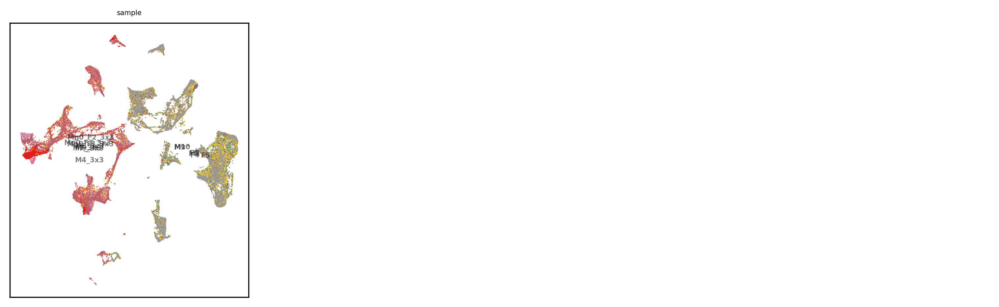

In [12]:
show_basis = 'X_umap'
show_cols = ['sample']

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [13]:
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, 
                      domain_key='sample', 
                      latent_dim=32,
                      n_epochs=10,
                      augmentation_mask_prob = 0.3, 
                      clr_temperature = .5, # Check out advanced usage to learn what this parameter controls, 
                      use_decoder=True,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
p_intra_knn: 0.3


Epoch 0 Training: 1120it [00:20, 54.32it/s, loss=3.51]
Epoch 9 Training: 100%|██████████| 1120/1120 [00:15<00:00, 73.44it/s, loss=3.4] 


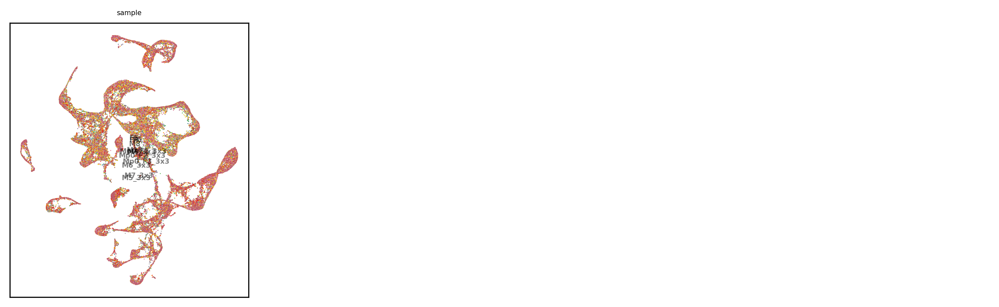

In [14]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
show_cols = ['sample']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [15]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
col = 'sample'
show_basis = f'{output_key}_UMAP_3D'
ccd.pl.plot_embedding_3d(
        adata, basis=show_basis, color_by=col,
        save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
        point_size=1, opacity=0.8, width=1500, height=1000
    )

In [16]:

adata.write_h5ad(data_dir / f"kim_adata_processed_{file_suffix}.h5ad")

file_suffix

'Dec05-0731'